# PROJET MACHINE LEARNING / DETECTION DE RACES DE CHIENS

## Membres du groupes :

### Garmy SAMB
### Cheikh Tidiane DIAGNE
### Alioune CISSE
### Serigne Mbaye THIAM


## Sous la supervision de :

### Mme Mously DIAW

<h1><span style="color:#343434" id="sommaire">Sommaire</span></h1>

1. [Preprocessing des images](#section_1)     
    1.1. [Visualisation de la liste des races (classes) et un exemple de données](#section_1_1)     
    1.2. [Modification de la taille des images](#section_1_2)     
    1.3. [Modification des histogrammes des images](#section_1_3)      
    1.4. [Application de filtres](#section_1_4)      
    1.5. [Augmentation de données](#section_1_5)      
    1.6. [Fonction de traitement par lot pour le preprocessing](#section_1_6)      
    
2. [Modèle CNN from scratch](#section_2)      
    2.1. [Préparation des données pour le modèle CNN](#section_2_1)      
    2.2. [Construction du modèle CNN](#section_2_2)      
    2.3. [Entrainement et évaluation du modèle CNN](#section_2_3)      

3. [Transfert Learning : Modèle CNN pré-entrainé Xception](#section_3)      
    3.1. [Importation du modèle Xception pré-entrainé](#section_3_1)      
    3.2. [Entrainement du nouveau classifier sur Xception](#section_3_2)      
    3.3. [Comparaison avec l'architecture du modèle ResNet50](#section_3_3)      
    3.4. [Optimization des paramètres sur la couche classifier du modèle Xception](#section_3_4)      
    
4. [Xception fine tuning](#section_4)    
5. [Evaluation Xception fine tuned sur données test](#section_5)      
6. [Interface de prédiction sur de nouvelles données](#section_6)

In [2]:
# Import libraries
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import timeit
import cv2 as cv
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix 

import tensorflow as tf
from tensorflow import keras
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from keras import backend as K
import kerastuner as kt
from keras.models import load_model

from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense

import gradio as gr

In [3]:
warnings.filterwarnings('ignore')

In [4]:
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

GPU device not found
Found GPU at: 


# <span style="color:#343434" id="section_1">1. Preprocessing des images</span>

Dans cette partie, nous allons effectuer le prétraitement des images qui consiste entre autres à leur redimensionnement.

In [ ]:
# Define path to data
annotations_dir = 'C://Users/FATOU KINE/Desktop/ISE/ISE2/SECOND SEMESTRE/Machine Learning 2/Projet/Annotation' 
images_dir = 'C:/Users/FATOU KINE/Desktop/ISE/ISE2/SECOND SEMESTRE/Machine Learning 2/Projet/Images'

In [6]:
# Count the number of classes (dogs breeds)
breed_list = os.listdir(images_dir)
print("Number of breeds in dataset:", (len(breed_list)))

Number of breeds in dataset: 120


Le jeu de données contient 120 races de chiens différentes, ce qui correspond à 120 classes pour notre classificateur. L'étape suivante consiste à compter le nombre d'images pour chaque race de chien afin de vérifier si la distribution est équitable entre les classes. Une répartition équilibrée est essentielle pour entraîner un classificateur capable de généraliser efficacement à travers toutes les races.

Le décompte des images pour chaque race de chien nous permettra de comprendre si certaines races sont surreprésentées ou sous-représentées, ce qui peut avoir un impact sur les performances du classificateur. Un jeu de données équilibré garantira que le modèle reçoit suffisamment d'exemples de chaque classe pour apprendre efficacement les caractéristiques distinctives de chaque race.

En résumé, l'objectif est d'évaluer la répartition des images à travers les 120 races de chiens du jeu de données afin d'assurer une représentation équilibrée pour l'entraînement réussi du classificateur.

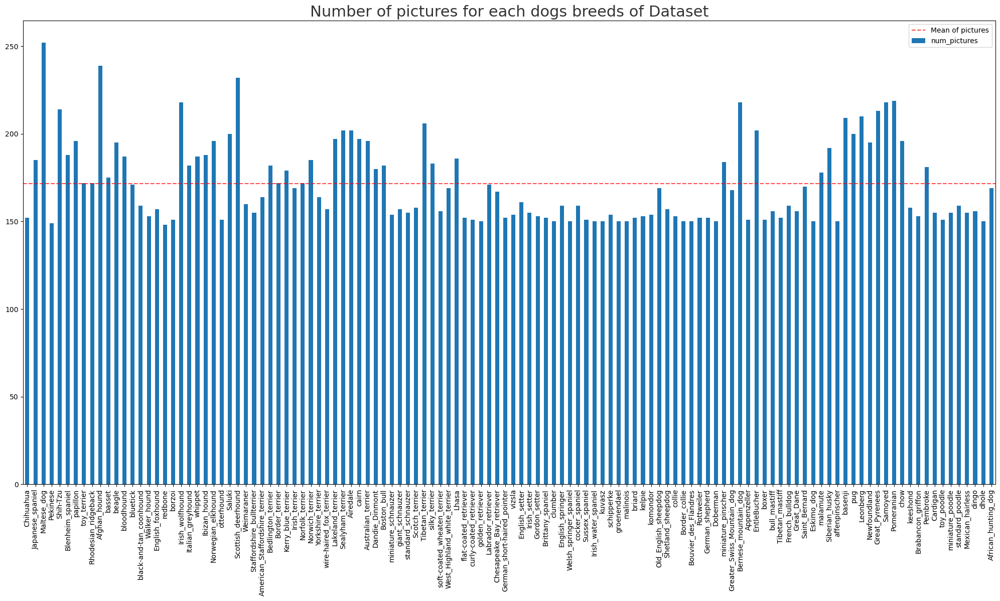

In [7]:
# Count number of pictures for each breed
df_breeds = pd.DataFrame(
    index=[breed.split('-',1)[1]
           for breed in breed_list],
    data=[len(os.listdir(images_dir + "/" + name))
          for name in breed_list],
    columns=["num_pictures"])

# Plot results
fig, ax = plt.subplots(1, 1, figsize=(25,12))
df_breeds.plot(kind="bar",
               legend=False,
               ax=ax)
ax.axhline(df_breeds["num_pictures"].mean(),
           color='r', alpha=.7,
           linestyle='--',
           label="Mean of pictures")
plt.title("Number of pictures for each "\
          "dogs breeds of Dataset",
          color="#343434", fontsize=22)
plt.legend()
plt.show()

Après avoir effectué le comptage des images pour chaque race de chien dans le jeu de données, nous constatons que toutes les races sont bien représentées en images. La moyenne du nombre de photos par classe est de 171. Cela signifie qu'aucune race n'est sous-représentée, ce qui est une excellente nouvelle pour la qualité de notre étude.

Nous pouvons donc conserver toutes les races de chiens dans notre ensemble de données pour le moment, car elles disposent toutes d'un nombre suffisant d'images pour permettre un entraînement efficace de notre modèle.

Enfin, pour mieux appréhender la variété des images, nous pouvons regarder quelques exemples de photos pour chaque race de chien disponibles dans notre base d'étude. Cela nous permettra de mieux comprendre la diversité des données et de nous assurer de la qualité et de la représentativité des images pour chaque classe.

In [8]:
def show_images_classes(path, classes, num_sample):
    """This function is used to display the first 
    n images of a directory passed as an argument. 
    It is adapted to subdirectories. 
    
    The matplotlib.image library must be loaded 
    with the alias mpimg. 

    Parameters
    ----------------------------------------
    path : string
        Link of root directory
    classes : string 
        Name of the subdirectory
    num_smaple : integer
        Number of picture to show
    ----------------------------------------
    """
    fig = plt.figure(figsize=(20,20))
    fig.patch.set_facecolor('#343434')
    plt.suptitle("{}".format(classes.split("-")[1]), y=.83,
                 color="white", fontsize=22)
    images = os.listdir(path + "/" + classes)[:num_sample]
    for i in range(num_sample):
        img = mpimg.imread(path+"/"+classes+"/"+images[i])
        plt.subplot(num_sample/5+1, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

In [9]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import math

def show_images_classes(path, classes, num_sample):
    # ... (rest of the function remains unchanged)
    num_rows = int(math.ceil(num_sample / 5))  # Convert to integer and round up
    fig = plt.figure(figsize=(20, 20))
    fig.patch.set_facecolor('#343434')
    plt.suptitle("{}".format(classes.split("-")[1]), y=.83,
                 color="white", fontsize=22)
    images = os.listdir(path + "/" + classes)[:num_sample]
    for i in range(num_sample):
        img = mpimg.imread(path + "/" + classes + "/" + images[i])
        plt.subplot(num_rows, 5, i + 1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

# The rest of your code...


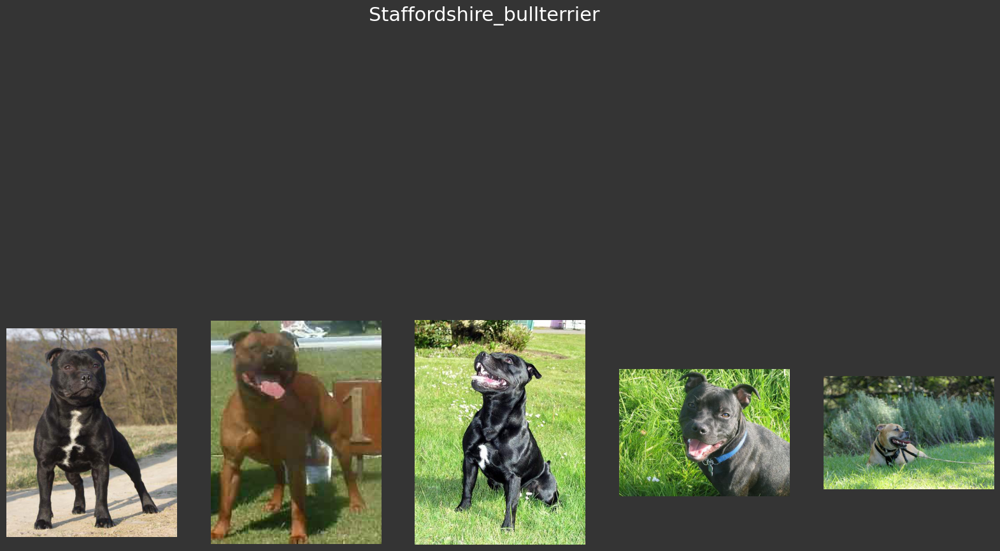

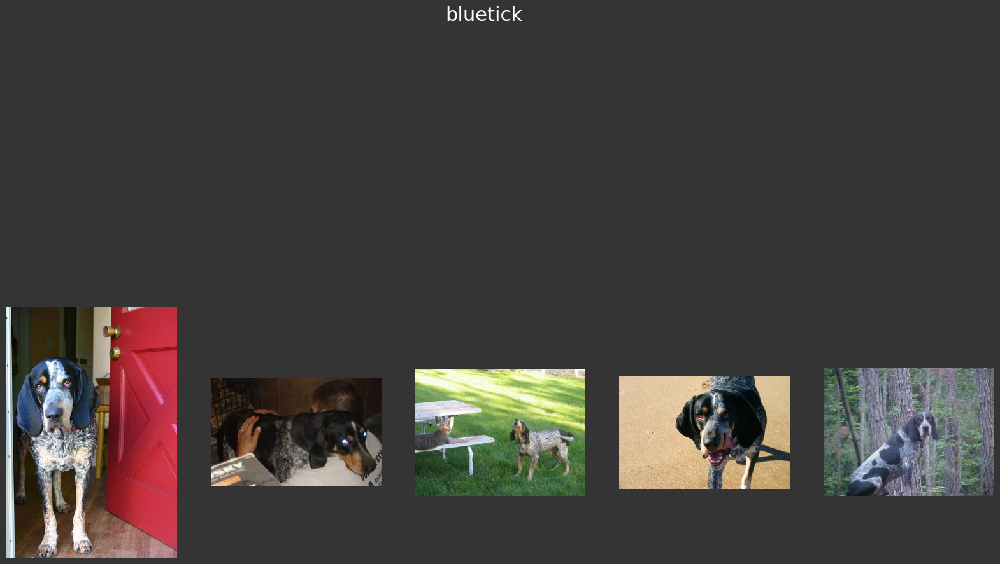

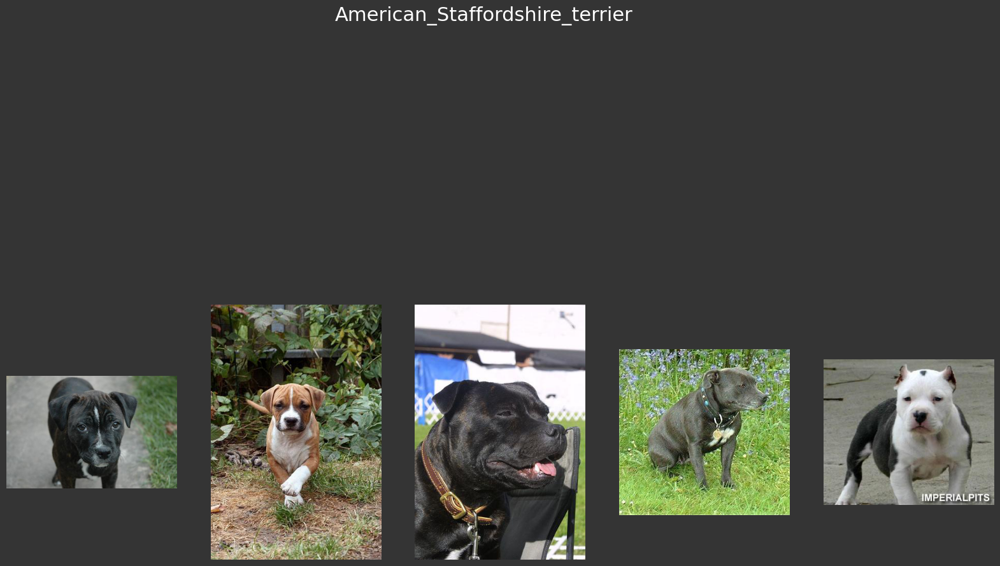

In [10]:
for i in np.random.randint(0, len(breed_list), size=3):
    show_images_classes(images_dir, breed_list[i], 5)

Dans cette étape (1.2), nous allons modifier la taille des images pour les adapter aux contraintes du modèle de CNN en transfert d'apprentissage. Cela aura pour effet de réduire les temps de calcul du modèle que nous allons créer "from scratch".

En observant les exemples d'images, on constate que les chiens ne sont pas toujours centrés dans la photo et que les zooms peuvent varier. Lorsque nous redimensionnerons les images, cela ne changera pas ces attributs. Au lieu de cela, l'image sera déformée pour correspondre aux nouvelles dimensions.

Pour commencer, nous allons réaliser cette transformation sur une image test afin de mieux comprendre comment les images seront ajustées pour s'adapter aux contraintes du modèle de transfert d'apprentissage. Cette étape nous permettra de nous assurer que les images restent appropriées pour l'entraînement du modèle et d'évaluer l'effet de la transformation sur leur qualité visuelle.

In [11]:
# Define test image
img_test = (images_dir 
            + "/" 
            + "n02085782-Japanese_spaniel/n02085782_1626.jpg")
img_test = cv.imread(img_test)

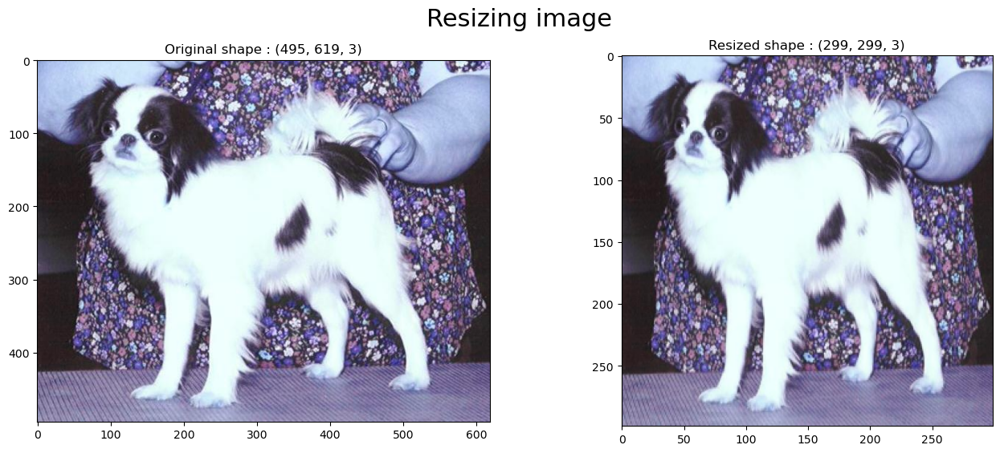

In [12]:
# setting dim of the resize
height = 299
width = 299
dim = (width, height)
# resize image with OpenCV
res_img = cv.resize(img_test, dim, interpolation=cv.INTER_LINEAR)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_test)
plt.title("Original shape : {}".format(img_test.shape))
plt.subplot(1, 2, 2)
plt.imshow(res_img)
plt.title("Resized shape : {}".format(res_img.shape))
plt.suptitle("Resizing image",
             color="black", 
             fontsize=22, y=.98)
plt.show()

Dans cette étape (1.3), nous allons traiter le problème de déformation dû au redimensionnement des images en utilisant des méthodes basées sur les histogrammes. L'histogramme d'une image numérique représente la répartition statistique de ses pixels selon leur intensité.

Nous allons commencer par observer une image spécifique et effectuer des transformations dans différents espaces de couleur, notamment le système de codage YUV. Le format YUV est créé à partir d'une source RVB (Rouge, Vert, Bleu) et se compose de trois composantes : Y qui représente la luminance (informations de luminosité), ainsi que U et V qui représentent les données de chrominance (informations de couleur). Cette représentation en trois dimensions nous permettra de mieux visualiser l'histogramme de l'image pour chaque composante.

L'utilisation de méthodes basées sur l'histogramme dans le prétraitement des images nous permettra d'améliorer l'exposition, le contraste, et autres attributs visuels, ce qui est important pour rendre les données plus homogènes avant de les utiliser pour l'entraînement du modèle.

In [13]:
# Transform image with differents color sets
img_RGB = cv.cvtColor(img_test, cv.COLOR_BGR2RGB)
img_grayscale = cv.cvtColor(img_test, cv.COLOR_RGB2GRAY)
img_YUV = cv.cvtColor(img_test,cv.COLOR_BGR2YUV)

In [14]:
# Create histogram
def plot_histogram(init_img, convert_img):
    """Function allowing to display the initial
    and converted images according to a certain
    colorimetric format as well as the histogram
    of the latter. 

    Parameters
    -------------------------------------------
    init_img : list
        init_img[0] = Title of the init image
        init_img[1] = Init openCV image
    convert_img : list
        convert_img[0] = Title of the converted
        convert_img[1] = converted openCV image
    -------------------------------------------
    """
    hist, bins = np.histogram(
                    convert_img[1].flatten(),
                    256, [0,256])
    # Cumulative Distribution Function
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()

    # Plot histogram
    fig = plt.figure(figsize=(25,6))
    plt.subplot(1, 3, 1)
    plt.imshow(init_img[1])
    plt.title("{} Image".format(init_img[0]), 
              color="#343434")
    plt.subplot(1, 3, 2)
    plt.imshow(convert_img[1])
    plt.title("{} Image".format(convert_img[0]), 
              color="#343434")
    plt.subplot(1, 3, 3)
    plt.plot(cdf_normalized, 
             color='r', alpha=.7,
             linestyle='--')
    plt.hist(convert_img[1].flatten(),256,[0,256])
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.title("Histogram of convert image", color="#343434")
    plt.suptitle("Histogram and cumulative "\
                 "distribution for test image",
              color="black", fontsize=22, y=.98)
    plt.show()

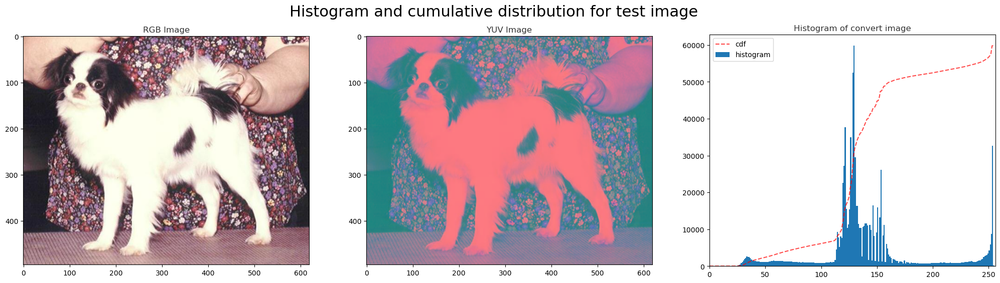

In [15]:
plot_histogram(["RGB", img_RGB], ["YUV", img_YUV])

### Egalisation

On constate ici des pics importants au centre de l'histogram. Dans le cadre d'une bonne égalisation (amélioration du contraste), il est nécessaire de répartir la lumière dans tout le spectre de l'image. 

**Testons l'égalisation avec OpenCV :**     

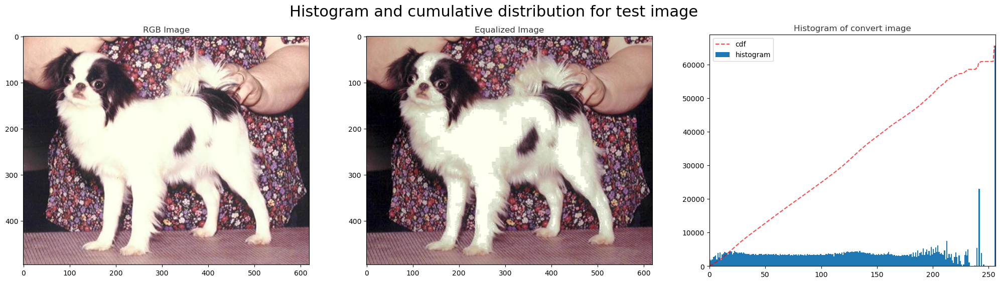

In [16]:
# Equalization
img_YUV[:,:,0] = cv.equalizeHist(img_YUV[:,:,0])
img_equ = cv.cvtColor(img_YUV, cv.COLOR_YUV2RGB)
plot_histogram(["RGB", img_RGB], ["Equalized", img_equ])

L'image résultante est donc bien égualisée, l'histogramme couvre l'ensemble du spectre et la CDF est constante et linéaire. Ce pré-traitement sera donc appliqué à un échantillon de 3 races pour des besoins pratiques.

Les images peuvent pour de nombreuses raisons être bruitées, c'est à dire comporter des pixels atypiques qui peuvent fausser la détection de features. Par exemple de causes de bruits :
* Caractéristiques de l'appareil photo,
* Compression des images JPEG
* Mauvaise résolution ...

Le filtre non-local means est l'un des meilleurs filtres pour débruiter une image. Contrairement aux filtres locaux, qui se basent sur un groupe de pixels entourant le pixel cible pour lisser l'image, le filtrage des moyennes non locales prend en compte tous les pixels de l'image. Il calcule la moyenne pondérée de tous les pixels de l'image en fonction de leur similarité avec le pixel cible. Cela permet d'obtenir une meilleure clarté dans l'image après le filtrage, tout en préservant davantage de détails par rapport aux algorithmes de moyenne locale.

Nous allons donc tester l'effet de ce filtre sur notre image test pour observer comment il débruite l'image et améliore sa qualité visuelle. Ce processus nous permettra de mieux comprendre l'impact du filtre non-local means sur le traitement des images et d'évaluer son efficacité dans la réduction du bruit tout en préservant les détails importants de l'image

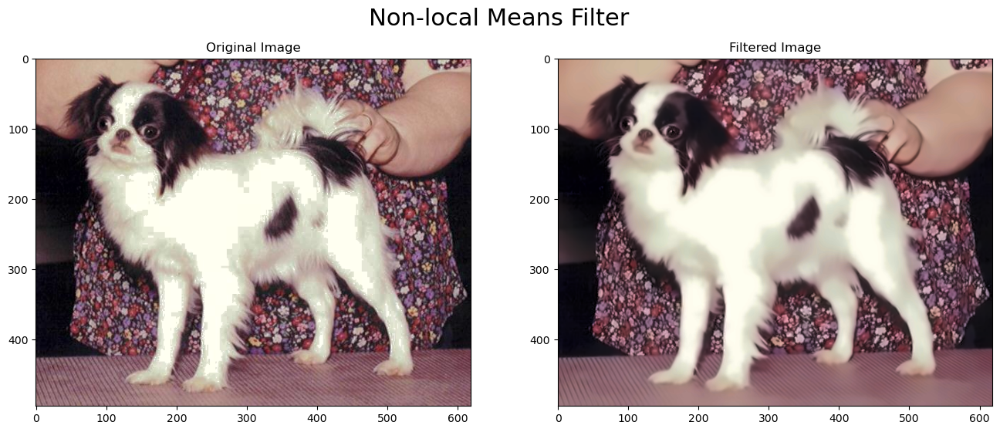

In [17]:
# Apply non-local means filter on test img
dst_img = cv.fastNlMeansDenoisingColored(
    src=img_equ,
    dst=None,
    h=10,
    hColor=10,
    templateWindowSize=7,
    searchWindowSize=21)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_equ)
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(dst_img)
plt.title("Filtered Image")
plt.suptitle("Non-local Means Filter",
             color="black", 
             fontsize=22, y=.98)
plt.show()

## <span style="color:#343434" id="section_1_5">1.5. Augmentation de données</span>

Étant donné que le dataset contient relativement peu de données (20 000 images), il y a un risque de sur-entraînement du modèle. Cela signifie que le modèle peut devenir trop spécialisé pour les données d'entraînement spécifiques et ne pas généraliser efficacement à de nouvelles données, ce qui peut entraîner des performances médiocres sur des exemples inconnus.

Pour résoudre ce problème, nous allons utiliser la technique de Data Augmentation. L'objectif de la Data Augmentation est de créer de nouvelles images en appliquant des transformations aléatoires aux images existantes. Cela permet d'augmenter artificiellement la taille du dataset et d'introduire de la variabilité dans les données d'entraînement.

Keras fournit une méthode appelée ImageDataGenerator qui permet de réaliser facilement des opérations de Data Augmentation telles que le mirroring (miroir), la rotation, le zoom, etc., de manière aléatoire. En appliquant ces transformations aléatoires aux images d'entraînement, le modèle sera exposé à une plus grande diversité de données, ce qui devrait l'aider à mieux généraliser et à développer des règles de décision plus robustes et adaptables aux nouvelles données.

En utilisant la Data Augmentation, nous améliorons la capacité du modèle à généraliser à de nouveaux exemples et à mieux répondre aux variations dans les données réelles. Cela peut conduire à une meilleure performance du modèle sur des données qu'il n'a jamais rencontrées auparavant.

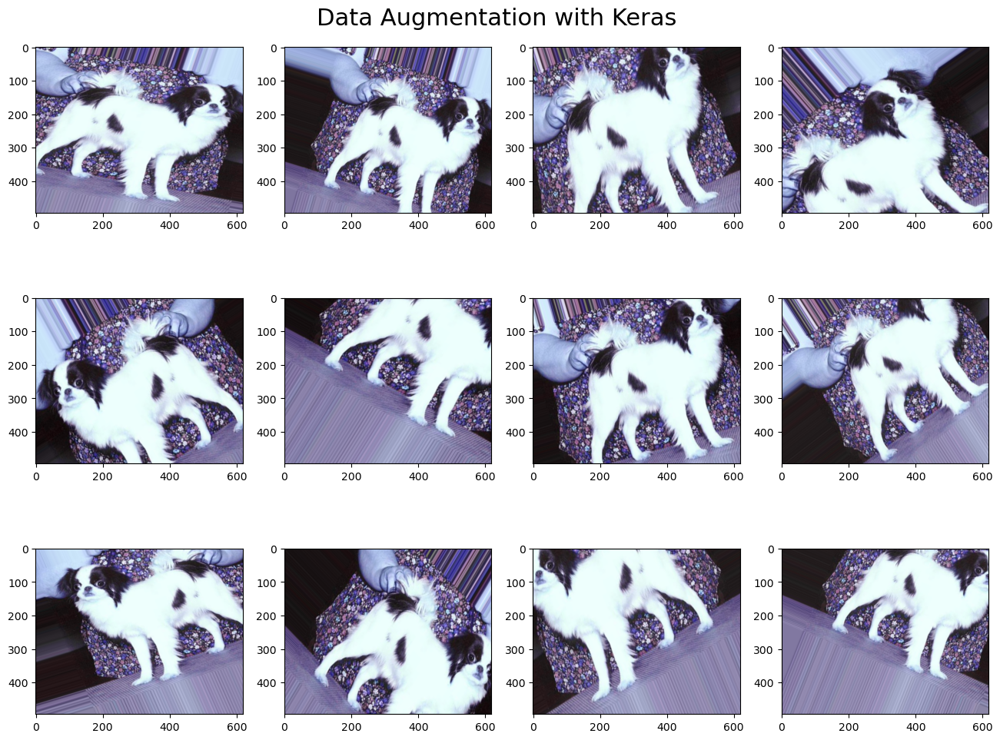

In [18]:
#Initilize Data Generator Keras
augmented_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

# Convert test img to array
x = image.img_to_array(img_test)
x = x.reshape((1,) + x.shape)

i=0
fig = plt.figure(figsize=(16,12))
for batch in augmented_datagen.flow(x, batch_size=1):
    ax = fig.add_subplot(3,4,i+1)
    ax.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 12 == 0:
        break

plt.suptitle("Data Augmentation with Keras",
             color="black", 
             fontsize=22, y=.90)
plt.show()



Nous allons déjà tester les fonctions et la classification sur 3 races de chien afin de limiter les temps de calcul. Constuisons la fonction de preprocessing qui retournera les labels et images :

In [21]:
def preprocessing_cnn(directories, img_width, img_height):
    """Preprocessing of images in order to integrate them 
    into a convolutional neural network. Equalization, 
    Denoising and transformation of the image into Array. 
    Simultaneous creation of labels (y). 

    Parameters
    ---------------------------------------------------
    directoriesList : list
        List of files to be processed.
    img_width : integer
        width of the image to be reached for resizing
    img_height : integer
        height of the image to be reached for resizing
    ---------------------------------------------------
    """
    img_list=[]
    labels=[]
    for index, breed in enumerate(directories):
        for image_name in os.listdir(images_dir+"/"+breed):
            # Read image
            img = cv.imread(images_dir+"/"+breed+"/"+image_name)
            img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
            # Resize image
            dim = (img_width, img_height)
            img = cv.resize(img, dim, interpolation=cv.INTER_LINEAR)
            # Equalization
            img_yuv = cv.cvtColor(img,cv.COLOR_BGR2YUV)
            img_yuv[:,:,0] = cv.equalizeHist(img_yuv[:,:,0])
            img_equ = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)
            # Apply non-local means filter on test img
            dst_img = cv.fastNlMeansDenoisingColored(
                src=img_equ,
                dst=None,
                h=10,
                hColor=10,
                templateWindowSize=7,
                searchWindowSize=21)
            
            # Convert modified img to array
            img_array = image.img_to_array(dst_img)
            
            # Append lists of labels and images
            img_list.append(np.array(img_array))
            labels.append(breed.split("-")[1])
    
    return img_list, labels

In [22]:
fr_breed_list = [
    'n02096294-Australian_terrier',
    'n02093256-Staffordshire_bullterrier',
    'n02099601-golden_retriever']

In [23]:
# Define numbers of breeds to preprocess
num_breeds = len(fr_breed_list) 

# Execute preprocessor on selection
start_time = timeit.default_timer()
# X = images
# y = labels
X, y = preprocessing_cnn(fr_breed_list, 299, 299)
# Convert in numpy array
X = np.array(X)
y = np.array(y)
preprocess_time = timeit.default_timer() - start_time
print("-" * 50)
print("Execution time for preprocessing :")
print("-" * 50)
print("Number of images preprocessed : {}"\
     .format(len(y)))
print("Shape of images np.array : {}"\
     .format(X.shape))
print("Total time : {:.2f}s".format(preprocess_time))

--------------------------------------------------
Execution time for preprocessing :
--------------------------------------------------
Number of images preprocessed : 501
Shape of images np.array : (501, 299, 299, 3)
Total time : 813.12s


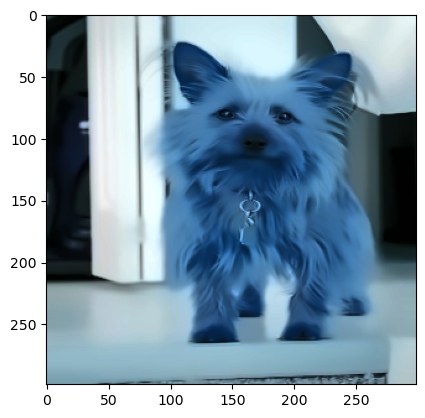

In [27]:
# Show exemple preprocessed image
plt.imshow(image.array_to_img(X[12]))

# <span style="color:#343434" id="section_2">2. Modèle CNN from scratch</span>

Avant d'entraîner notre premier modèle, nous avons prétraité les images de test en utilisant des techniques telles que l'égalisation, le débruitage et le redimensionnement. En conséquence, nous avons créé des listes de tableaux Numpy regroupant les images sous format numériques, prêtes à être utilisées pour l'entraînement du modèle.

Cependant, avant de procéder à l'entraînement, il est crucial de mélanger les images. Actuellement, toutes les photos d'une même race sont regroupées les unes après les autres dans les listes. Si nous n'effectuons pas de mélange, le modèle risque de s'entraîner de manière biaisée et de ne pas généraliser correctement. En mélangeant les images, nous nous assurons que l'ordre des données n'influence pas l'apprentissage du modèle, ce qui est essentiel pour obtenir des performances fiables et généralisables.

En résumé, avant d'entraîner notre modèle, nous devons mélanger les images pour éviter tout biais et garantir un apprentissage efficace et équitable à partir des données prétraitées.

## <span style="color:#343434" id="section_2_1">2.1. Préparation des données pour le modèle CNN</span>

Pour éviter le surapprentissage (overfitting) et réduire la variance lors de l'entraînement du modèle, nous allons mélanger les données dans les listes X et y. Ce mélange a pour objectif de garantir que les exemples d'entraînement sont répartis de manière aléatoire lors du premier passage dans le réseau.

En effectuant ce brassage aléatoire, nous nous assurons que le modèle ne mémorise pas l'ordre spécifique des données d'entraînement, ce qui pourrait conduire à une sur-optimisation sur ces données et à une mauvaise généralisation sur de nouvelles données. Le mélange des données permet au modèle de rencontrer des exemples variés à chaque itération d'entraînement, favorisant ainsi un apprentissage plus robuste et généralisable.

En résumé, le mélange des données (brassage) dans les listes X et y est une étape importante pour réduire le risque de surapprentissage et assurer que le modèle apprenne de manière plus générale à partir des données disponibles.

In [28]:
# Using np.shuffle
img_space = np.arange(X.shape[0])
np.random.seed(8)
# Shuffle the space
np.random.shuffle(img_space)
# Apply to X and y in same order
X = X[img_space]
y = y[img_space]

Après avoir mélangé les images, nous devons effectuer des modifications supplémentaires pour préparer nos données pour les modélisations Keras. Il est essentiel de modifier les types de nos données d'entrée X et de convertir les données à prédire (y) en variables numériques. Actuellement, les données à prédire sont stockées sous forme textuelle, ce qui n'est pas approprié pour l'entraînement du modèle.

Pour résoudre ce problème, nous allons utiliser un outil simple appelé LabelEncoder pour convertir les données à prédire en valeurs numériques. Le LabelEncoder attribuera des valeurs numériques uniques à chaque classe ou catégorie présente dans les données à prédire. Cela permettra au modèle de travailler avec des variables numériques pour l'entraînement et l'évaluation.

En résumé, en utilisant le LabelEncoder, nous pouvons convertir les données à prédire (actuellement sous forme textuelle) en valeurs numériques, ce qui est une étape nécessaire pour préparer nos données pour les modélisations Keras. Une fois que cette conversion est effectuée, nos données seront prêtes pour l'entraînement du modèle de classification.

In [29]:
# Change X type 
X = X.astype(np.float32)
# Encode y text data in numeric
encoder = LabelEncoder()
encoder.fit(y)
y = encoder.transform(y)

In [30]:
# Verifie encoder created classes
print(encoder.classes_)

['Australian_terrier' 'Staffordshire_bullterrier' 'golden_retriever']


Maintenant que nous avons mélangé les images et converti les données à prédire en variables numériques à l'aide du LabelEncoder, nous pouvons créer les ensembles d'entraînement et de test qui serviront à l'entraînement de nos modèles. Ces ensembles seront essentiels pour entraîner le modèle sur les données d'entraînement et évaluer ses performances sur des données inconnues.

Le set de validation, quant à lui, sera créé directement dans le générateur Keras. La validation est une étape cruciale pendant l'entraînement du modèle, car elle permet de surveiller la performance du modèle sur des données qu'il n'a pas encore vues. Cela nous donne une estimation de la capacité du modèle à généraliser à de nouvelles données.

In [31]:
### Create train and test set
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print("-" * 50)
print("Size of created sets :")
print("-" * 50)
print("Train set size = ",x_train.shape[0])
print("Test set size = ",x_test.shape[0])

--------------------------------------------------
Size of created sets :
--------------------------------------------------
Train set size =  400
Test set size =  101


Dernière étape de la préparation, nous allons créer les générateurs Keras pour les sets de données en incluant la Data Augmentation pour le jeu d'entrainement :

In [32]:
# Data generator on train set with Data Augmentation
# Validation set is define here
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(rescale=1./255)

Pour la construction du modèle CNN, nous allons utiliser un réseau de neurones à convolution en imbriquant plusieurs couches :

Couches de convolution : Elles permettent de repérer la présence de motifs ou caractéristiques spécifiques dans les images en effectuant des opérations de filtrage par convolution.

Couches de Pooling : L'opération de pooling réduit la taille des images tout en préservant les caractéristiques importantes, ce qui permet de diminuer la complexité du modèle et d'éviter le surapprentissage.

Couches de correction ReLU : Cette couche applique la fonction d'activation ReLU (Rectified Linear Unit), qui remplace les valeurs négatives par des zéros, permettant ainsi une meilleure propagation des informations dans le réseau.

Couches Fully connected : Ces couches prennent un vecteur en entrée et produisent un nouveau vecteur en sortie, en appliquant une combinaison linéaire et une fonction d'activation aux valeurs reçues en entrée.

Dropout : La méthode du dropout consiste à désactiver aléatoirement des sorties de neurones pendant l'entraînement pour éviter le surapprentissage.

Pour notre modèle, nous allons tester une architecture simple avec seulement 3 couches de convolution. Cette architecture servira de baseline pour les prochains modèles que nous pourrons développer.

En plus de l'accuracy, nous allons définir des métriques plus précises pour l'évaluation de notre modèle, telles que le Score F1 qui combine la précision et le rappel (recall). Le score F1 est utile lorsque nous avons un déséquilibre entre les classes et que l'accuracy seule n'est pas suffisante pour évaluer la performance du modèle.

En résumé, nous allons construire notre modèle CNN avec une architecture simple comprenant 3 couches de convolution et définir des métriques plus précises, telles que le score F1, pour évaluer la performance du modèle.

In [33]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [38]:
K.clear_session()
model = Sequential()
# Convolution layer
model.add(Conv2D(filters=16,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
# Pooling layer
model.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Second convolution layer
model.add(Conv2D(filters=32,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# Third convolution layer
model.add(Conv2D(filters=64,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(GlobalAveragePooling2D())
# Fully connected layers
model.add(Dense(128, activation='relu'))
model.add(Dense(num_breeds, activation='softmax'))
plot_model(model, to_file='CNN_model_plot.png', 
           show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [39]:
# Compile the CNN Model
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", f1_m])

Notre modèle est créé, nous allons pouvoir l'entrainer sur 50 époques grâce aux générateur précédement créés et stocker les résultats** pour ensuite les analyser :

In [40]:
history = model.fit(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
12/12 - 49s - loss: 1.0478 - accuracy: 0.4231 - f1_m: 1.7320 - val_loss: 1.0945 - val_accuracy: 0.3375 - val_f1_m: 2.5533 - 49s/epoch - 4s/step
Epoch 2/20
12/12 - 28s - loss: 0.9995 - accuracy: 0.4952 - f1_m: 1.3006 - val_loss: 1.1158 - val_accuracy: 0.3375 - val_f1_m: 2.1912 - 28s/epoch - 2s/step
Epoch 3/20
12/12 - 28s - loss: 1.0138 - accuracy: 0.5000 - f1_m: 1.5098 - val_loss: 1.1409 - val_accuracy: 0.3375 - val_f1_m: 1.7995 - 28s/epoch - 2s/step
Epoch 4/20
12/12 - 27s - loss: 1.0051 - accuracy: 0.4952 - f1_m: 1.3936 - val_loss: 1.1956 - val_accuracy: 0.3375 - val_f1_m: 1.1686 - 27s/epoch - 2s/step
Epoch 5/20
12/12 - 30s - loss: 0.9594 - accuracy: 0.5192 - f1_m: 1.5927 - val_loss: 1.2149 - val_accuracy: 0.3375 - val_f1_m: 1.1876 - 30s/epoch - 2s/step
Epoch 6/20
12/12 - 27s - loss: 0.9429 - accuracy: 0.5096 - f1_m: 1.5969 - val_loss: 1.2602 - val_accuracy: 0.3375 - val_f1_m: 1.1591 - 27s/epoch - 2s/step
Epoch 7/20
12/12 - 28s - loss: 0.9396 - accuracy: 0.5577 - f1_m: 1.359

In [41]:
def plot_history_scores(dict_history, first_score, second_score):
    with plt.style.context('seaborn-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        # summarize history for accuracy
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        # summarize history for loss
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()

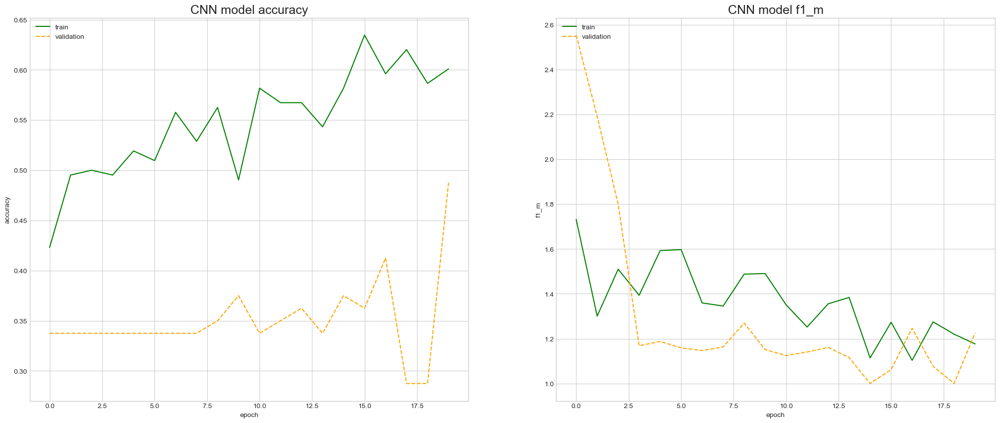

In [42]:
plot_history_scores(
    dict_history = history, 
    first_score = "accuracy", 
    second_score = "f1_m")

On voit que sur ce modèle CNN from scratch les métriques ne sont pas bonnes. Le score F1 est élevé et stable sur les 50 époques.

Nous allons maintenant tester des modèles pré-entrainés et vérifier si les performances sont meilleures comparées à notre baseline.

# <span style="color:#343434" id="section_3">3. Transfert Learning : Modèle CNN pré-entrainé Xception</span>

Le modèle Xception est une architecture dérivée de l'architecture Inception, qui vise à réduire la consommation de ressources des réseaux de neurones convolutifs (CNN) profonds. Pour cela, elle repose sur l'utilisation de blocs de traitement spécifiques :

Utilisation de filtres 3x3 et 5x5 : Pour réduire la dimension de l'image analysée, les filtres 3x3 et 5x5 sont utilisés, en ajoutant une étape de filtrage 1x1 en amont. La convolution de taille 1x1 effectue une opération de pooling sur les valeurs d'un pixel dans l'espace des dimensions de l'image.

Convolution séparable en profondeur : Xception remplace les modules Inception par des modules de convolutions séparables en profondeur (depthwise separable convolution). Cette approche permet de considérablement réduire l'utilisation de ressources lors du calcul matriciel, sans modifier le nombre de paramètres. Cela permet d'économiser en puissance de calcul tout en maintenant la performance du modèle.

Liaisons résiduelles : Xception ajoute des liaisons résiduelles pour faciliter le flux d'informations et le passage du gradient lors de la rétropropagation. Cela améliore la stabilité de l'entraînement du modèle et accélère la convergence.     


In [43]:
K.clear_session()
# Import Xception trained model
xception_model = tf.keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False, 
    pooling='avg',
    input_shape=(299,299,3))

# look at the differents layers
print("-" * 50)
print("Xception base model layers :")
print("-" * 50)
for layer in xception_model.layers:
    print(layer)

83683744/83683744 [==============================] - 19s 0us/step
--------------------------------------------------
Xception base model layers :
--------------------------------------------------


## <span style="color:#343434" id="section_3_2">3.2. Entrainement du nouveau classifier sur Xception</span>

Notre jeu de données est petit et relativement similaire au dataset original. Si nous entrainons le réseau complet, nous risquons de rencontrer des problèmes d'over-fitting. Nous allons donc **"geler" tous les layers de Xception et entrainer uniquement le classifier**.

In [44]:
for layer in xception_model.layers:
    layer.trainable = False

Après avoir importé le modèle Xception, nous remarquons que la dernière couche importée est une couche GlobalAveragePooling2D. Pour créer un nouveau modèle complet, nous allons ajouter les couches suivantes à la suite de cette couche :

Couche complètement connectée (Fully Connected) : Cette couche prendra les sorties de la couche GlobalAveragePooling2D et les connectera à un ensemble de neurones entièrement connectés. Cela permettra au modèle d'apprendre des combinaisons plus complexes de features et de faire des prédictions plus précises.

DropOut : Nous ajouterons ensuite une couche de Dropout pour éviter le surapprentissage. Le Dropout désactivera aléatoirement certains neurones pendant l'entraînement, ce qui permet d'améliorer la généralisation du modèle.

Classifier : Enfin, nous ajouterons une couche de classification finale qui produira les sorties correspondant aux différentes classes de chiens que nous voulons prédire.

En résumé, nous allons créer un nouveau modèle en ajoutant une couche complètement connectée, une couche de Dropout et un classifier à la suite de la couche GlobalAveragePooling2D du modèle Xception. Cette architecture complète nous permettra d'obtenir des prédictions précises pour les différentes races de chiens dans notre dataset.

In [45]:
# Add new fully-connected layers
base_output = xception_model.output
base_output = Dense(128, activation='relu')(base_output)
base_output = Dropout(0.2)(base_output)
# Output : new classifier
predictions = Dense(num_breeds, activation='softmax')(base_output)

# Define new model
my_xcept_model = Model(inputs=xception_model.input,
                       outputs=predictions)
my_xcept_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

In [46]:
Xception_plot = plot_model(my_xcept_model,
                           to_file='xcept_model_plot.png',
                           show_shapes=True,
                           show_layer_names=False)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


Il est également nécessaire de modifier les générateurs pour y **intégrer le `preprocess_input` Xception** recommandé par Keras :

In [47]:
# Data generator on train set with Data Augmentation
# and preprocess_input Xception
# Validation set is define here
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

In [48]:
history_xcept = my_xcept_model.fit(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
12/12 - 137s - loss: 0.5141 - accuracy: 0.8077 - f1_m: 0.9809 - val_loss: 0.1360 - val_accuracy: 0.9625 - val_f1_m: 0.9074 - 137s/epoch - 11s/step
Epoch 2/20
12/12 - 117s - loss: 0.1871 - accuracy: 0.9375 - f1_m: 0.7908 - val_loss: 0.1105 - val_accuracy: 0.9625 - val_f1_m: 0.8265 - 117s/epoch - 9s/step
Epoch 3/20
12/12 - 116s - loss: 0.0654 - accuracy: 0.9904 - f1_m: 0.7709 - val_loss: 0.1253 - val_accuracy: 0.9375 - val_f1_m: 0.8007 - 116s/epoch - 9s/step
Epoch 4/20
12/12 - 117s - loss: 0.0655 - accuracy: 0.9760 - f1_m: 0.7699 - val_loss: 0.0737 - val_accuracy: 0.9625 - val_f1_m: 0.8113 - 117s/epoch - 9s/step
Epoch 5/20
12/12 - 119s - loss: 0.0761 - accuracy: 0.9712 - f1_m: 0.7796 - val_loss: 0.0954 - val_accuracy: 0.9625 - val_f1_m: 0.7833 - 119s/epoch - 9s/step
Epoch 6/20
12/12 - 116s - loss: 0.0722 - accuracy: 0.9615 - f1_m: 0.7899 - val_loss: 0.0558 - val_accuracy: 0.9750 - val_f1_m: 0.8203 - 116s/epoch - 9s/step
Epoch 7/20
12/12 - 116s - loss: 0.0597 - accuracy: 0.9856

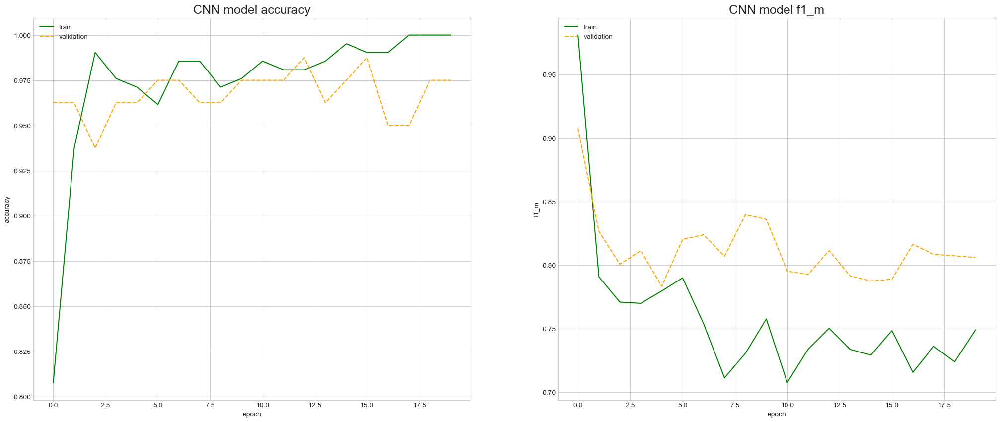

In [49]:
plot_history_scores(
    dict_history = history_xcept, 
    first_score = "accuracy", 
    second_score = "f1_m")

On voit très bien ici que les métriques du modèle Xception sur nos données sont bien meilleures que le modèle "from scratch" quand les couches profondes ne sont pas entrainées. D'autre part, le modèle apprend très vite et l'accuracy augmente rapidement *(tout comme la perte diminue)*. Comparons les 2 modèles :

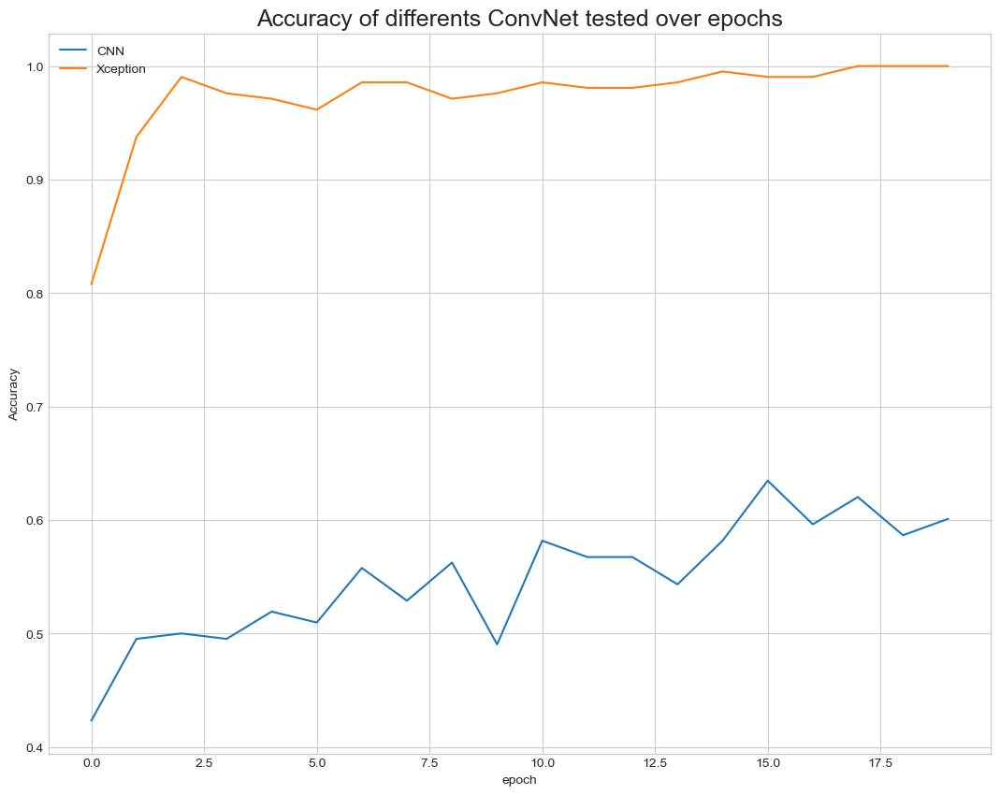

In [50]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN')
    plt.plot(history_xcept.history['accuracy'],
             label='Xception')
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

In [51]:
xcept_mean_accuracy = np.mean(history_xcept.history['val_accuracy'])
xcept_mean_f1 = np.mean(history_xcept.history['val_f1_m'])
print("-" * 50)
print("Xception base model validation Scores :")
print("-" * 50)
print("Mean validation accuracy: {:.2f}"\
      .format(xcept_mean_accuracy))
print("Mean validation F1 score: {:.2f}"\
      .format(xcept_mean_f1))

--------------------------------------------------
Xception base model validation Scores :
--------------------------------------------------
Mean validation accuracy: 0.97
Mean validation F1 score: 0.81


## <span style="color:#343434" id="section_3_3">3.3. Comparaison avec l'architecture du modèle ResNet50</span>

Dans un réseau de neurones à convolution profonde, plusieurs couches sont empilées les unes sur les autres pour effectuer une tâche spécifique. Au fur et à mesure que les données passent à travers ces couches, le réseau apprend progressivement des caractéristiques de différents niveaux de complexité, allant des caractéristiques de bas niveau aux caractéristiques de haut niveau.

Dans l'apprentissage résiduel, au lieu de chercher à apprendre directement certaines caractéristiques, le réseau apprend des caractéristiques résiduelles. Le résidu représente la différence entre la sortie attendue et la sortie actuelle d'une couche. Plutôt que d'apprendre la fonction directe pour atteindre la sortie souhaitée, le réseau apprend à ajuster les caractéristiques existantes pour obtenir le résidu désiré.

L'architecture ResNet met en œuvre l'apprentissage résiduel en utilisant des connexions de raccourci. Ces connexions relient directement l'entrée de la nième couche à une (n+x)ième couche, où x est généralement petit. En ajoutant ces connexions de raccourci, le réseau peut apprendre à ajuster les caractéristiques résiduelles plus facilement, ce qui facilite la formation de réseaux profonds sans rencontrer de problèmes tels que le problème de disparition des gradients.

In [52]:
K.clear_session()
# Import ResNet50 trained model
resnet_model = tf.keras.applications.ResNet50(
    weights='imagenet',
    include_top=False, 
    pooling='avg',
    input_shape=(299,299,3))

# Dont retrain layers
for rn_layer in resnet_model.layers:
    rn_layer.trainable = False
    
# Add new fully-connected layers
rn_base_output = resnet_model.output
rn_base_output = Dense(128, activation='relu')(rn_base_output)
rn_base_output = Dropout(0.2)(rn_base_output)
# Output : new classifier
rn_predictions = Dense(num_breeds, activation='softmax')(rn_base_output)

# Define new model
my_resnet_model = Model(inputs=resnet_model.input,
                        outputs=rn_predictions)
my_resnet_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

# Data generator on train set with Data Augmentation
# and preprocess_input Resnet
# Validation set is define here
rn_train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.resnet.preprocess_input)

#For validation and test, just rescale
rn_test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet.preprocess_input)

94765736/94765736 [==============================] - 25s 0us/step


In [53]:
history_resnet = my_resnet_model.fit(
    rn_train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=rn_train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
12/12 - 114s - loss: 0.8868 - accuracy: 0.6394 - f1_m: 0.8937 - val_loss: 0.2805 - val_accuracy: 0.9375 - val_f1_m: 0.9138 - 114s/epoch - 9s/step
Epoch 2/20
12/12 - 102s - loss: 0.3160 - accuracy: 0.8798 - f1_m: 0.8614 - val_loss: 0.2187 - val_accuracy: 0.9250 - val_f1_m: 0.8593 - 102s/epoch - 8s/step
Epoch 3/20
12/12 - 108s - loss: 0.1797 - accuracy: 0.9471 - f1_m: 0.7665 - val_loss: 0.2420 - val_accuracy: 0.9250 - val_f1_m: 0.8231 - 108s/epoch - 9s/step
Epoch 4/20
12/12 - 117s - loss: 0.1546 - accuracy: 0.9327 - f1_m: 0.7959 - val_loss: 0.2397 - val_accuracy: 0.9250 - val_f1_m: 0.8203 - 117s/epoch - 9s/step
Epoch 5/20
12/12 - 113s - loss: 0.1085 - accuracy: 0.9663 - f1_m: 0.7651 - val_loss: 0.1590 - val_accuracy: 0.9250 - val_f1_m: 0.7803 - 113s/epoch - 9s/step
Epoch 6/20
12/12 - 109s - loss: 0.1374 - accuracy: 0.9567 - f1_m: 0.7898 - val_loss: 0.1800 - val_accuracy: 0.9375 - val_f1_m: 0.8304 - 109s/epoch - 9s/step
Epoch 7/20
12/12 - 106s - loss: 0.1364 - accuracy: 0.9471 

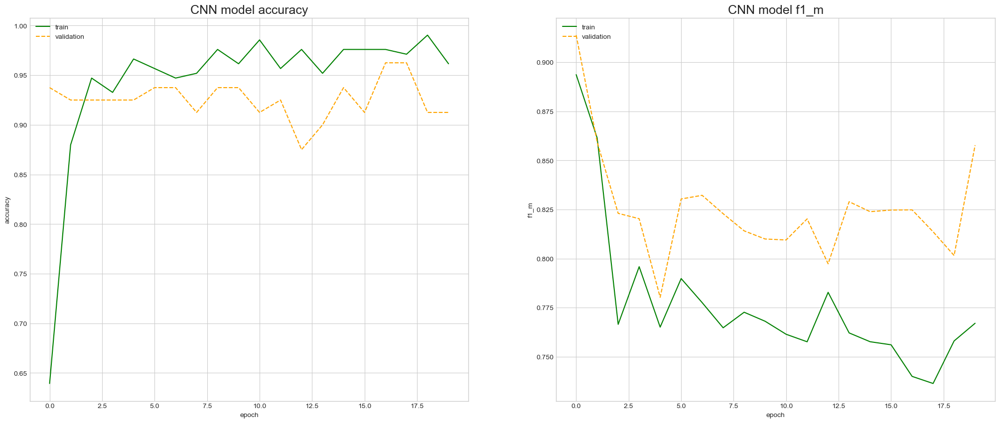

In [54]:
plot_history_scores(
    dict_history = history_resnet, 
    first_score = "accuracy", 
    second_score = "f1_m")

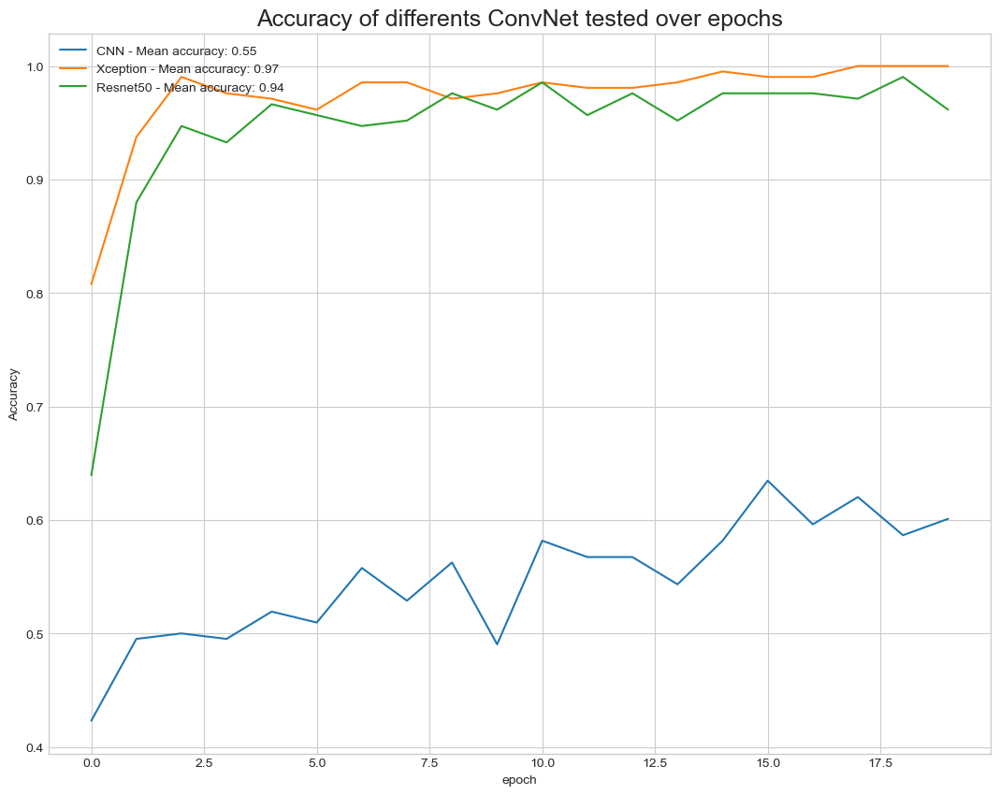

In [55]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN - Mean accuracy: {:.2f}'.format(
                 np.mean(history.history['accuracy'])))
    plt.plot(history_xcept.history['accuracy'],
             label='Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(history_xcept.history['accuracy'])))
    plt.plot(history_resnet.history['accuracy'],
             label='Resnet50 - Mean accuracy: {:.2f}'.format(
                 np.mean(history_resnet.history['accuracy'])))
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

A cette étape, sans amélioration des paramètres et sans fine-tuning, **le modèle Xception offre les meilleurs résultats**. Nous conserverons donc ce modèle pour la suite.

## <span style="color:#343434" id="section_3_4">3.4. Optimization des paramètres sur la couche classifier du modèle Xception</span>

Ici nous allons utiliser `kerastuner` pour améliorer les paramètres de la couche que nous avons ajouté au moèle Xception de Keras et séléctionner les meilleurs.

In [72]:
def model_builder(hp):
    # Load base model
    xception_model = tf.keras.applications.xception.Xception(
        weights='imagenet',
        include_top=False,
        pooling='avg',
        input_shape=(299,299,3))
    
    for layer in xception_model.layers:
        layer.trainable = False
    
    base_output = xception_model.output
    
    # Tune dense units
    hp_units = hp.Int('dense_units',
                      min_value=32,
                      max_value=300,
                      step=32,
                      default=128)

    base_output = Dense(units=hp_units, 
                        activation='relu')(base_output)
    
    base_output = Dropout(0.2)(base_output)
    
    # Output : new classifier
    predictions = Dense(num_breeds, activation='softmax')(base_output)

    # Define new model
    my_xcept_model = Model(inputs=xception_model.input,
                       outputs=predictions)
    
    # Tune learning rate
    hp_learning_rate = hp.Choice(
        name='learning_rate',
        values=[1e-2, 1e-3, 1e-4])

    my_xcept_model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy", f1_m])
    
    return my_xcept_model

In [73]:
# Tune the learning rate for the optimizer
# Constuct the tuner of kerastuner
tuner = kt.RandomSearch(
    model_builder, 
    objective='val_accuracy',
    max_trials=5)

# Define a early stopping
stop_early = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=5)

# Search best params
tuner.search(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    epochs=10,
    callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("-" * 50)
print("Xception Hyperparameters optimization :")
print("-" * 50)
print(f"""
Best learning rate : {best_hps.get('learning_rate')}.\n
Best Dense units : {best_hps.get('dense_units')}.""")

Trial 5 Complete [00h 23m 52s]
val_accuracy: 1.0

Best val_accuracy So Far: 1.0
Total elapsed time: 02h 00m 05s
INFO:tensorflow:Oracle triggered exit
--------------------------------------------------
Xception Hyperparameters optimization :
--------------------------------------------------

Best learning rate : 0.001.

Best Dense units : 192.


Une fois les meilleurs paramètres trouvés, **on peut ré-entrainer le modèle grâce au tuner**, sur 30 époques avant de le sauvegarder pour les prochaines améliorations *(fine-tuning)* :

In [75]:
hypermodel = tuner.hypermodel.build(best_hps)
hypermodel.fit(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'), 
    epochs=30,
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    verbose=2)
hypermodel.save('xception_hypermodel.h5')
print("Model saved")

Epoch 1/30
20/20 - 166s - loss: 0.3231 - accuracy: 0.8719 - f1_m: 1.0000 - val_loss: 0.1384 - val_accuracy: 0.9375 - val_f1_m: 0.7986 - 166s/epoch - 8s/step
Epoch 2/30
20/20 - 145s - loss: 0.1209 - accuracy: 0.9469 - f1_m: 0.7686 - val_loss: 0.0680 - val_accuracy: 0.9750 - val_f1_m: 0.8053 - 145s/epoch - 7s/step
Epoch 3/30
20/20 - 140s - loss: 0.0570 - accuracy: 0.9781 - f1_m: 0.7390 - val_loss: 0.0421 - val_accuracy: 0.9750 - val_f1_m: 0.7938 - 140s/epoch - 7s/step
Epoch 4/30
20/20 - 138s - loss: 0.0719 - accuracy: 0.9656 - f1_m: 0.7660 - val_loss: 0.0867 - val_accuracy: 0.9625 - val_f1_m: 0.8276 - 138s/epoch - 7s/step
Epoch 5/30
20/20 - 134s - loss: 0.0806 - accuracy: 0.9750 - f1_m: 0.7681 - val_loss: 0.0846 - val_accuracy: 0.9625 - val_f1_m: 0.7982 - 134s/epoch - 7s/step
Epoch 6/30
20/20 - 135s - loss: 0.0771 - accuracy: 0.9625 - f1_m: 0.7479 - val_loss: 0.0330 - val_accuracy: 0.9875 - val_f1_m: 0.8190 - 135s/epoch - 7s/step
Epoch 7/30
20/20 - 134s - loss: 0.0512 - accuracy: 0.9781 

In [76]:
from kerastuner.tuners import RandomSearch

# <span style="color:#343434" id="section_4">4. Xception fine tuning</span>
Comme nous l'avons vu dans le schéma de l'architecture Xception, ce modèle dispose de 3 blocs : le flux, d'entrée, le flux moyen et le flux de sortie. **Nous allons ré-entrainer le dernier bloc sur le modèle sauvegardé** dont les paramètres ont été améliorés :

In [77]:
def xception_fine_tune(nb_layers):
    # Load the pre trained model
    hypermodel_t = load_model('./xception_hypermodel.h5', custom_objects={"f1_m": f1_m})
    
    # re train the last layers
    for i, layer in enumerate(hypermodel_t.layers):
        if i < nb_layers:
            layer.trainable = False
        else:
            layer.trainable = True
            
    # Compile model
    hypermodel_t.compile(
        optimizer='adam',
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy", f1_m])
    
    return hypermodel_t

In [78]:
# Define a early stopping
stop_early = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=5)

# Dont train the 115 first layers
my_tuned_xcept_model = xception_fine_tune(115)
fine_tuned_history = my_tuned_xcept_model.fit(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        shuffle=False,
        subset='training'), 
    epochs=20,
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        shuffle=False,
        subset='validation'),
    callbacks=[stop_early],
    verbose=2)

Epoch 1/20
20/20 - 516s - loss: 0.3431 - accuracy: 0.8813 - f1_m: 0.7767 - val_loss: 0.6101 - val_accuracy: 0.9250 - val_f1_m: 0.7898 - 516s/epoch - 26s/step
Epoch 2/20
20/20 - 320s - loss: 0.2003 - accuracy: 0.9438 - f1_m: 0.7676 - val_loss: 2.2110 - val_accuracy: 0.8375 - val_f1_m: 0.7898 - 320s/epoch - 16s/step
Epoch 3/20
20/20 - 217s - loss: 0.1034 - accuracy: 0.9656 - f1_m: 0.7818 - val_loss: 0.1114 - val_accuracy: 0.9750 - val_f1_m: 0.7898 - 217s/epoch - 11s/step
Epoch 4/20
20/20 - 221s - loss: 0.1009 - accuracy: 0.9781 - f1_m: 0.7344 - val_loss: 0.1753 - val_accuracy: 0.9625 - val_f1_m: 0.7898 - 221s/epoch - 11s/step
Epoch 5/20
20/20 - 233s - loss: 0.0865 - accuracy: 0.9750 - f1_m: 0.7469 - val_loss: 0.1238 - val_accuracy: 0.9500 - val_f1_m: 0.7898 - 233s/epoch - 12s/step
Epoch 6/20
20/20 - 218s - loss: 0.0959 - accuracy: 0.9688 - f1_m: 0.7508 - val_loss: 0.9952 - val_accuracy: 0.9000 - val_f1_m: 0.8065 - 218s/epoch - 11s/step
Epoch 7/20
20/20 - 211s - loss: 0.0641 - accuracy: 0

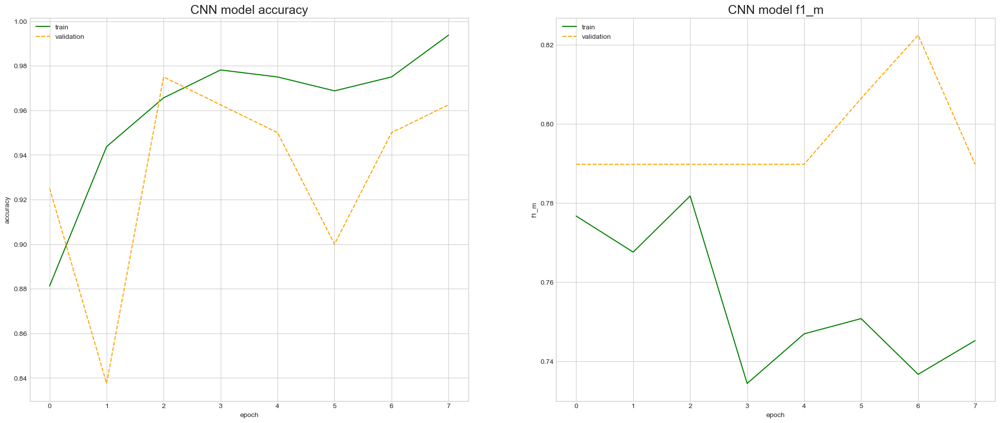

In [79]:
plot_history_scores(
    dict_history = fine_tuned_history, 
    first_score = "accuracy", 
    second_score = "f1_m")

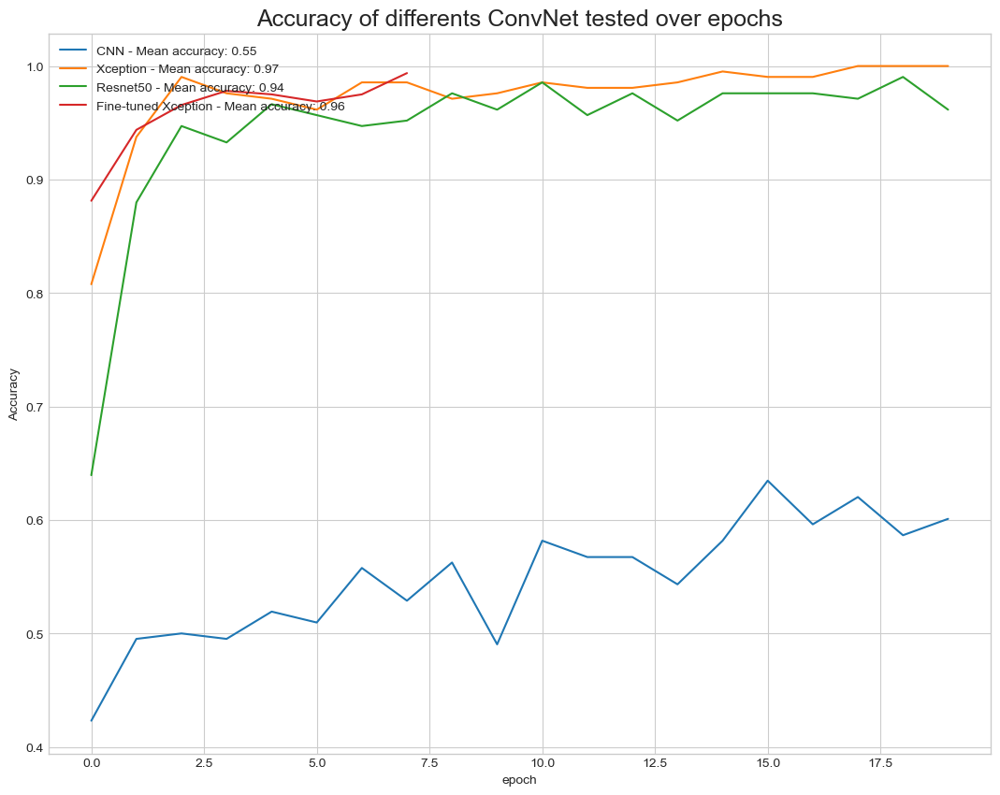

In [80]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN - Mean accuracy: {:.2f}'.format(
                 np.mean(history.history['accuracy'])))
    plt.plot(history_xcept.history['accuracy'],
             label='Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(history_xcept.history['accuracy'])))
    plt.plot(history_resnet.history['accuracy'],
             label='Resnet50 - Mean accuracy: {:.2f}'.format(
                 np.mean(history_resnet.history['accuracy'])))
    plt.plot(fine_tuned_history.history['accuracy'],
             label='Fine-tuned Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(fine_tuned_history.history['accuracy'])))
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

On voit ici que le meilleur modèle testé est le modèle **Xception pré-entrainé avec fine-tuning**. Nous allons donc réaliser les **évaluations sur nos données test**.

# <span style="color:#343434" id="section_5">5. Evaluation Xception fine tuned sur données test</span>
Nous allons évaluer ce dernier moèle sur les données test générées grâce au `ImageDataGenerator` de Keras définit préalablement :

In [81]:
# Model evaluation on test set
xception_eval = fine_tuned_history.model.evaluate(
    test_datagen.flow(
        x_test, y_test,
        batch_size=16,
        shuffle=False),
    verbose=1)
print("-" * 50)
print("Xception model evaluation :")
print("-" * 50)
print('Test Loss: {:.3f}'.format(xception_eval[0]))
print('Test Accuracy: {:.3f}'.format(xception_eval[1]))
print('Test F1 score: {:.3f}'.format(xception_eval[2]))

7/7 [==============================] - 43s 5s/step - loss: 0.1747 - accuracy: 0.9703 - f1_m: 0.7691
--------------------------------------------------
Xception model evaluation :
--------------------------------------------------
Test Loss: 0.175
Test Accuracy: 0.970
Test F1 score: 0.769


Puis nous allons éditer la **matrice de confusion** et le **rapport de classification** grâce aux données prédites :

7/7 [==============================] - 70s 6s/step


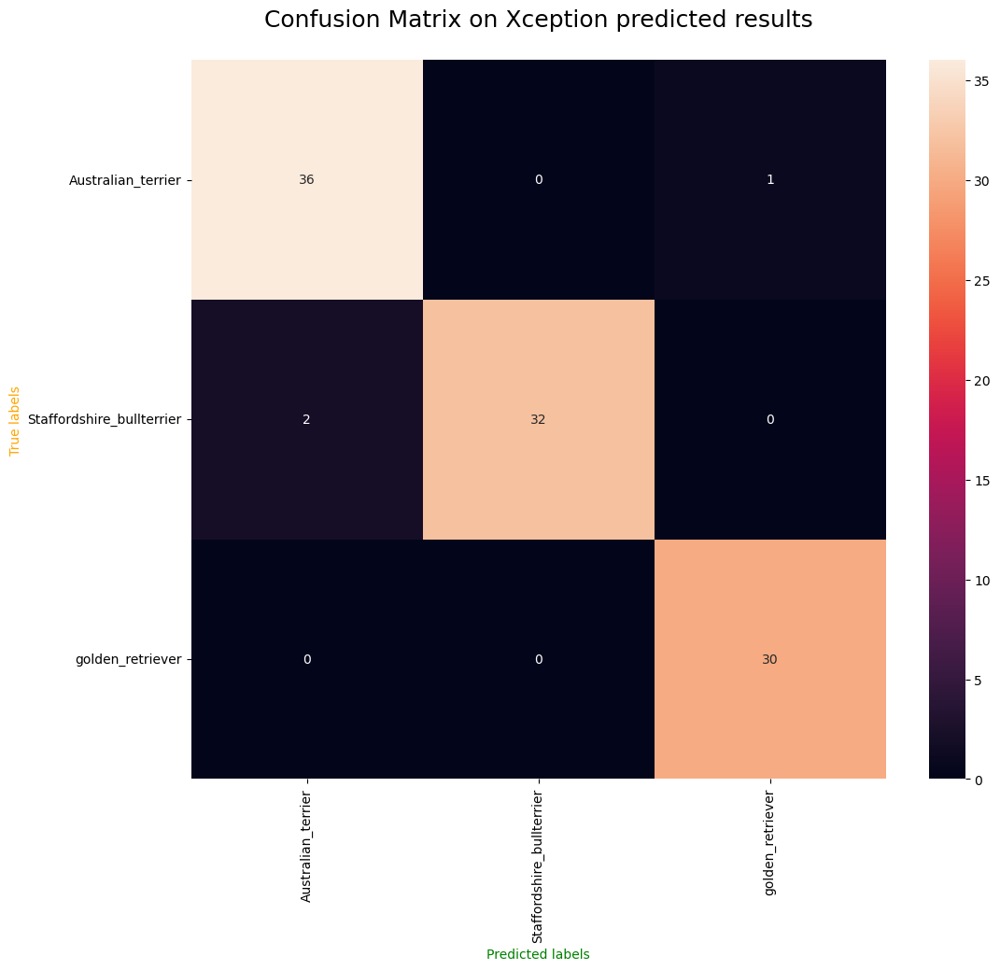

In [82]:
# Make predictions
Y_pred = fine_tuned_history.model.predict(
    test_datagen.flow(
        x_test, y_test,
        batch_size=16,
        shuffle=False))
y_pred = np.argmax(Y_pred, axis=1)

# Inverse transform of encoding
y_pred_s = encoder.inverse_transform(y_pred)
y_test_s = encoder.inverse_transform(y_test)

# Confusion Matrix
cf_matrix = confusion_matrix(y_test, y_pred)

fig = plt.figure(figsize=(12,10))
ax = sns.heatmap(cf_matrix, annot=True)
ax.set_xlabel("Predicted labels", color="g")
ax.set_ylabel("True labels", color="orange")
ax.xaxis.set_ticklabels(encoder.classes_, 
                        rotation='vertical')
ax.yaxis.set_ticklabels(encoder.classes_,
                        rotation='horizontal')
plt.title("Confusion Matrix on Xception predicted results\n",
          fontsize=18)
plt.show()

In [83]:
# Classification report
print(classification_report(
    y_test, y_pred, 
    target_names=sorted(set(y_test_s))))

                           precision    recall  f1-score   support

       Australian_terrier       0.95      0.97      0.96        37
Staffordshire_bullterrier       1.00      0.94      0.97        34
         golden_retriever       0.97      1.00      0.98        30

                 accuracy                           0.97       101
                macro avg       0.97      0.97      0.97       101
             weighted avg       0.97      0.97      0.97       101



La matrice de confusion et le rapport de classification nous indiquent que les résultats sont satisfaisants.ccuracy globale sur le jeu de test est de 0.72 et la matrice présente bien les couples predict / true majoritaires en diagonale.Nous allons visualiser quelques-unes de ces prédictions avec leurs labels :

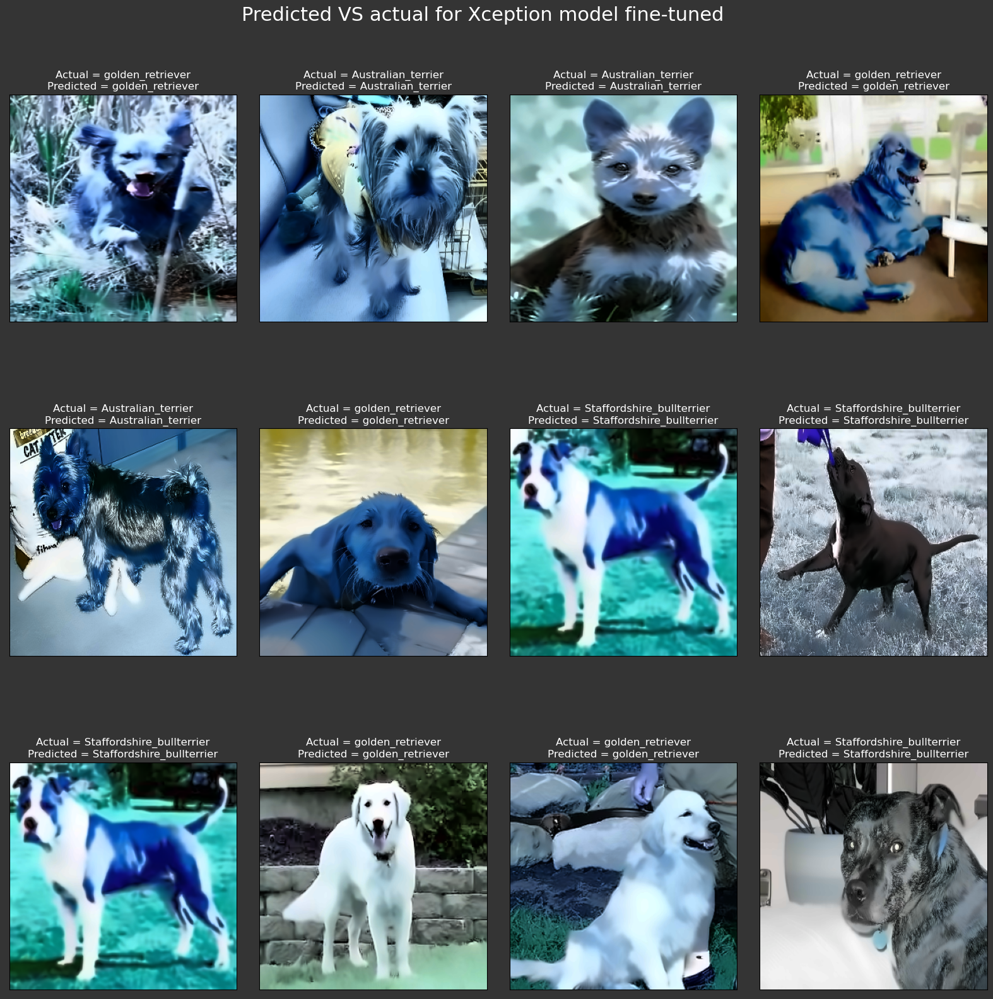

In [84]:
fig = plt.figure(1, figsize=(20,20))
fig.patch.set_facecolor('#343434')
plt.suptitle("Predicted VS actual for Xception model fine-tuned",
             y=.92, fontsize=22,
             color="white")

n = 0

for i in range(12):
    n+=1
    r = int(np.random.randint(0, x_test.shape[0], 1))
    plt.subplot(3,4,n)
    plt.subplots_adjust(hspace = 0.1, wspace = 0.1)
    plt.imshow(image.array_to_img(x_test[r]))
    plt.title('Actual = {}\nPredicted = {}'.format(y_test_s[r] , y_pred_s[r]),
              color="white")
    plt.xticks([]) , plt.yticks([])
    
plt.show()

On voit parfaitement ainsi que les prédictions finales sont bonnes dans la plupart des cas. 

# <span style="color:#343434" id="section_6">6. Interface de prédiction sur de nouvelles données</span>
A présent, nous allons développer un script pour permettre la prédiction de la race du chien à partir d'une photo. Notre modèle pré-entrainé servira de base. Pour cela, nous allons utiliser `Gradio` pour importer les images *(inputs)* et appliquer notre classifier afin de retourner la prédiction

In [85]:
# Save the last model
fine_tuned_history.model.save('xception_trained_model.h5')
print("Last model saved")

Last model saved


Après plusieurs test sur notre programme, on s'apperçoit que les résultats sont bons et que les prédictions sur des images inconnues sont exactes.